**Author:** Mourad Askar  
**Topic:** Hack4Space 2021  
**Created:** 7 May 2021  

# Understanding the data format

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import *

# Downloading files

In [2]:
from ftplib import FTP
from datetime import datetime

start = datetime.now()
ftp = FTP('atmos.nmsu.edu','anonymous', 'anonymous')
ftp.cwd("/PDS/data/MROM_2104/DATA/2015/201504/20150401/")

# Get All Files
files = ftp.nlst()

print(files)

# Print out the files
for file in files:
    print("Downloading..." + file)
    ftp.retrbinary("RETR " + file ,open("data/" + file, 'wb').write)

ftp.close()

end = datetime.now()
diff = end - start
print('All files downloaded for ' + str(diff.seconds) + 's')

['2015040100_DDR.LBL', '2015040100_DDR.TAB', '2015040104_DDR.LBL', '2015040104_DDR.TAB', '2015040108_DDR.LBL', '2015040108_DDR.TAB', '2015040112_DDR.LBL', '2015040112_DDR.TAB', '2015040116_DDR.LBL', '2015040116_DDR.TAB', '2015040120_DDR.LBL', '2015040120_DDR.TAB']
Downloading...2015040100_DDR.LBL
Downloading...2015040100_DDR.TAB
Downloading...2015040104_DDR.LBL
Downloading...2015040104_DDR.TAB
Downloading...2015040108_DDR.LBL
Downloading...2015040108_DDR.TAB
Downloading...2015040112_DDR.LBL
Downloading...2015040112_DDR.TAB
Downloading...2015040116_DDR.LBL
Downloading...2015040116_DDR.TAB
Downloading...2015040120_DDR.LBL
Downloading...2015040120_DDR.TAB
All files downloaded for 14s


In [3]:
df = pd.read_csv('data/2015040100_DDR.TAB', skiprows=25, header=None, low_memory=False)
df

,0,1,2,3,4,5,6,7,8,9,...,67,68,69,70,71,72,73,74,75,76
0,1,Date,UTC,SCLK,L_s,Solar_dist,Orb_num,Gqual,Solar_lat,Solar_lon,...,Ref_Date_5,Ref_UTC_5,Ref_Date_6,Ref_UTC_6,Ref_Date_7,Ref_UTC_7,Ref_Date_8,Ref_UTC_8,Ref_Date_9,Ref_UTC_9
1,1,Pres,T,T_err,Dust,Dust_err,H2Ovap,H2Ovap_err,H2Oice,H2Oice_err,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,"""01-Apr-2015""","""00:00:29.190""",1112313668.609,318.08637,217997971.719,40676,0,-16.52100,145.12160,...,,""" """,,""" """,,""" """,,""" """,,""" """
3,0,1.8789e+03,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1.6582e+03,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37097,0,7.0021e-03,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37098,0,6.1794e-03,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37099,0,5.4533e-03,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37100,0,4.8125e-03,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
ftp = FTP('atmos.nmsu.edu','anonymous', 'anonymous')
ftp.cwd("/PDS/data/MROM_2104/DATA/2015/201504/")

# Get All Files
files = ftp.nlst()

[print(f) for f in files]

ftp.close()

20150401
20150404
20150405
20150406
20150407
20150408
20150409
20150410
20150411
20150412
20150413
20150414
20150415
20150416
20150417
20150418
20150419
20150420
20150421
20150422
20150423
20150424
20150425
20150426
20150427
20150428
20150429
20150430


# Analyze data

I'm using the data parsed by Jacob

In [5]:
norm = lambda x: (x-min(x))/(max(x)-min(x))

In [6]:
columns = ['Date', 'Time', 'Lat', 'Long', 'Dust', 'Dust_Err', 'H20ice', 'H20_iceErr']
df = pd.read_csv('parserData.csv', names=columns)
df['TS'] = df['Date'] + '\t' + df['Time']
df['TS'] = pd.to_datetime(df['TS'],)
df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('TS')
df['Hour'] = df.index.hour
df['log_Dust'] = np.log(df['Dust'])
df['nrm_log_Dust'] = norm(df['log_Dust'])
df['nrm_Dust'] = norm(df['Dust'])
df['nrm_H20ice'] = norm(df['H20ice'])
df

,Date,Time,Lat,Long,Dust,Dust_Err,H20ice,H20_iceErr,Hour,log_Dust,nrm_log_Dust,nrm_Dust,nrm_H20ice
TS,,,,,,,,,,,,,
2015-04-01 00:00:29.190,2015-04-01,00:00:29.190,76.926,11.539,3.527100e-06,0.000003,0.002969,0.000473,0,-12.555035,0.500273,0.000286,0.999998
2015-04-01 00:00:29.190,2015-04-01,00:00:29.190,76.958,11.569,6.542500e-07,0.000001,0.003295,0.000390,0,-14.239776,0.397089,0.000053,0.999998
2015-04-01 00:00:29.190,2015-04-01,00:00:29.190,76.989,11.599,1.788700e-07,0.000001,0.003487,0.000336,0,-15.536607,0.317663,0.000014,0.999998
2015-04-01 00:00:29.190,2015-04-01,00:00:29.190,77.021,11.629,5.223300e-08,0.000001,0.003401,0.000305,0,-16.767551,0.242272,0.000004,0.999998
2015-04-01 00:00:29.190,2015-04-01,00:00:29.190,77.052,11.659,1.393500e-08,0.000001,0.002850,0.000280,0,-18.088862,0.161347,0.000001,0.999998
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-30 23:59:07.023,2015-04-30,23:59:07.023,60.112,51.726,5.881400e-06,0.000004,0.000010,0.000009,23,-12.043716,0.531589,0.000477,0.999998
2015-04-30 23:59:07.023,2015-04-30,23:59:07.023,60.153,51.785,3.499000e-06,0.000003,0.000019,0.000010,23,-12.563033,0.499783,0.000284,0.999998
2015-04-30 23:59:07.023,2015-04-30,23:59:07.023,60.196,51.846,2.090600e-06,0.000002,0.000027,0.000009,23,-13.078059,0.468240,0.000169,0.999998


In [7]:
df.describe(include='all', datetime_is_numeric=True).round(3)

,Date,Time,Lat,Long,Dust,Dust_Err,H20ice,H20_iceErr,Hour,log_Dust,nrm_log_Dust,nrm_Dust,nrm_H20ice
count,1368817,1368817,1368817.000,1368817.000,1368817.000,1368817.000,1368817.000,1368817.000,1368817.000,1368817.000,1368817.000,1368817.000,1368817.00
unique,NaN,57595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,22:07:22.289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2015-04-16 14:25:18.256421376,NaN,-5.397,-1.731,0.001,0.000,-100.989,-100.989,11.559,-10.837,0.606,0.046,0.99
min,2015-04-01 00:00:00,NaN,-87.805,-180.000,0.000,0.000,-9999.000,-9999.000,0.000,-20.723,0.000,0.000,0.00
25%,2015-04-10 00:00:00,NaN,-46.573,-91.976,0.000,0.000,0.000,0.000,6.000,-13.863,0.420,0.000,1.00
50%,2015-04-17 00:00:00,NaN,-4.179,-2.464,0.000,0.000,0.000,0.000,12.000,-8.940,0.722,0.011,1.00
75%,2015-04-24 00:00:00,NaN,35.989,87.947,0.001,0.000,0.000,0.000,18.000,-7.084,0.835,0.068,1.00
max,2015-04-30 00:00:00,NaN,89.739,179.999,0.012,0.005,0.020,0.049,23.000,-4.396,1.000,1.000,1.00


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1368817 entries, 2015-04-01 00:00:29.190000 to 2015-04-30 23:59:43.891000
Data columns (total 13 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   Date          1368817 non-null  datetime64[ns]
 1   Time          1368817 non-null  object        
 2   Lat           1368817 non-null  float64       
 3   Long          1368817 non-null  float64       
 4   Dust          1368817 non-null  float64       
 5   Dust_Err      1368817 non-null  float64       
 6   H20ice        1368817 non-null  float64       
 7   H20_iceErr    1368817 non-null  float64       
 8   Hour          1368817 non-null  int64         
 9   log_Dust      1368817 non-null  float64       
 10  nrm_log_Dust  1368817 non-null  float64       
 11  nrm_Dust      1368817 non-null  float64       
 12  nrm_H20ice    1368817 non-null  float64       
dtypes: datetime64[ns](1), float64(10), int64(1), object(1)


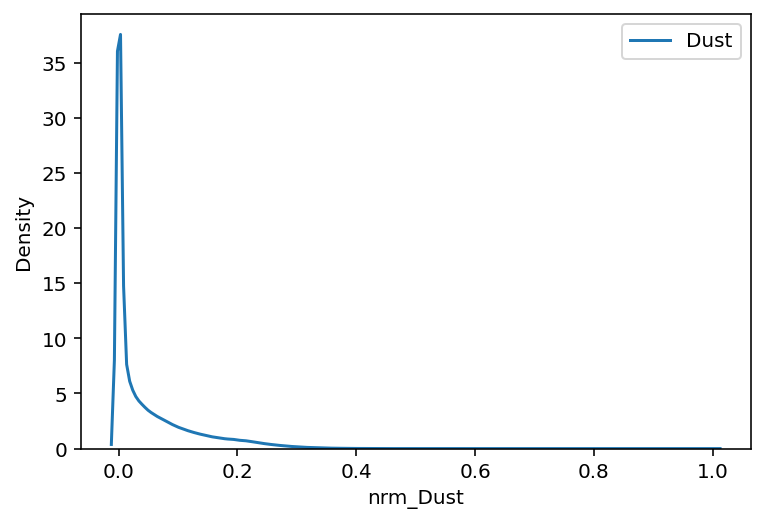

In [9]:
sns.kdeplot(df.nrm_Dust, label='Dust')
#sns.kdeplot(df.nrm_log_Dust, label='log(Dust)')
plt.legend()
plt.show()

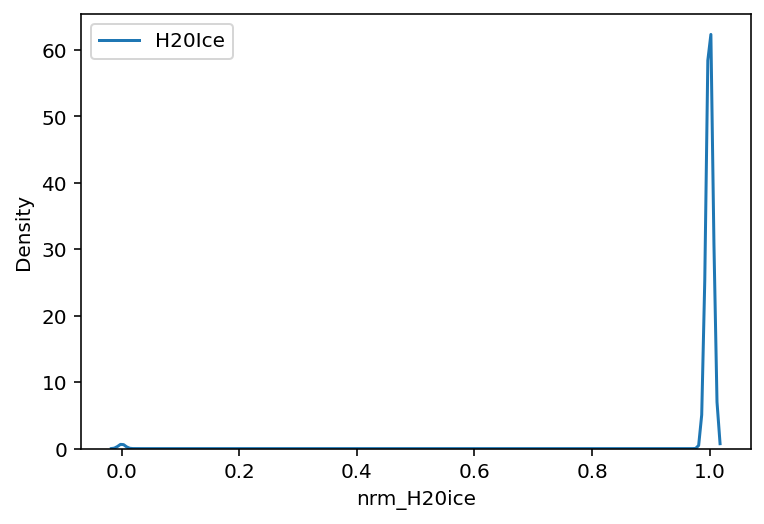

In [10]:
sns.kdeplot(df.nrm_H20ice, label='H20Ice')
plt.legend()
plt.show()

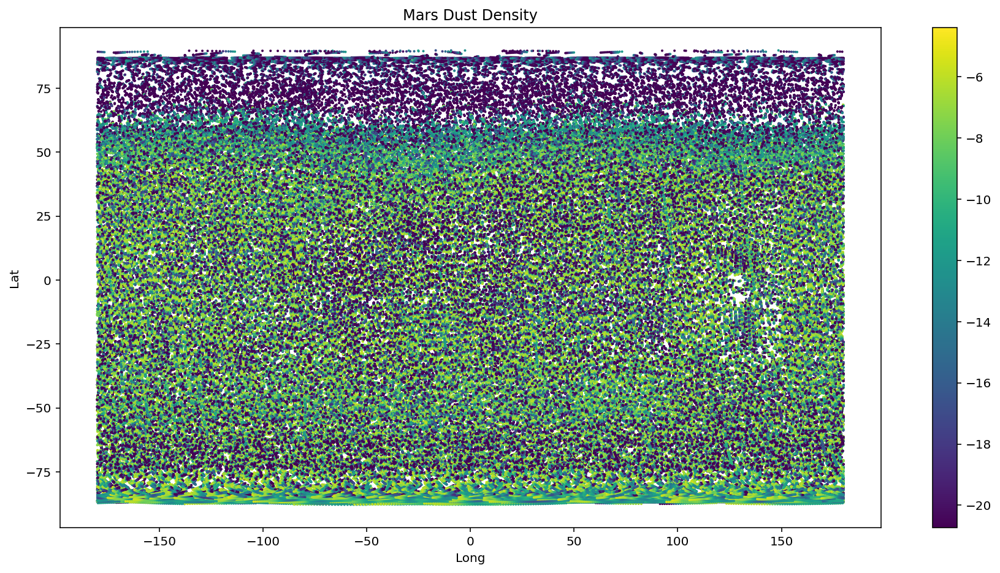

In [11]:
fig, ax = plt.subplots(figsize=(15,7.5))

s = ax.scatter('Long','Lat', s=1, c='log_Dust', cmap='viridis', data=df)
ax.set_ylabel('Lat')
ax.set_xlabel('Long')
plt.title(f'Mars Dust Density')
plt.colorbar(s)
plt.show()

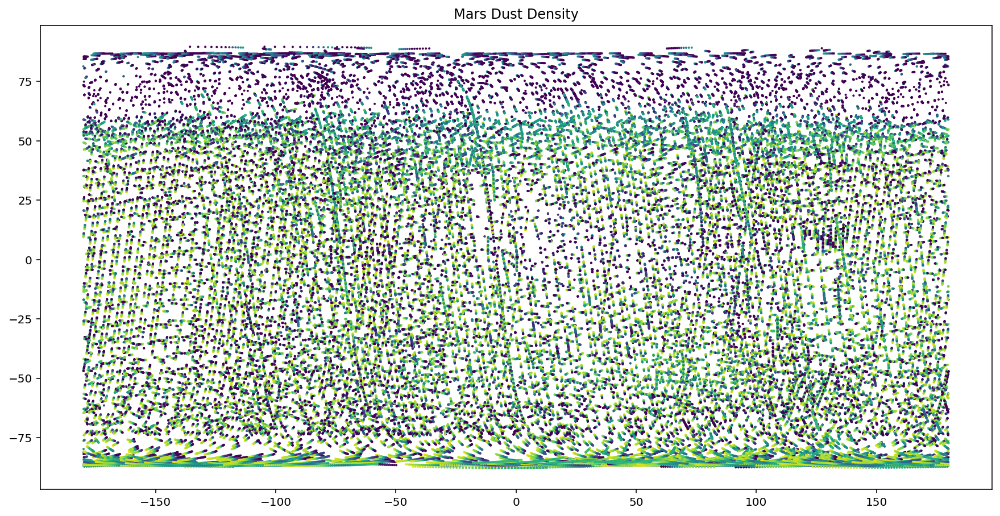

In [12]:
#date = '1-May-2015'
df_filtered = df[df.Time > '18:00:00.000']
fig, ax = plt.subplots(figsize=(15,7.5))
ax.scatter('Long','Lat', s=1, c='log_Dust', cmap='viridis', data=df_filtered)
#ax.set_ylabel('Lat')
#ax.set_xlabel('Long')
plt.title(f'Mars Dust Density')
#plt.legend(['Dust'])
plt.show()

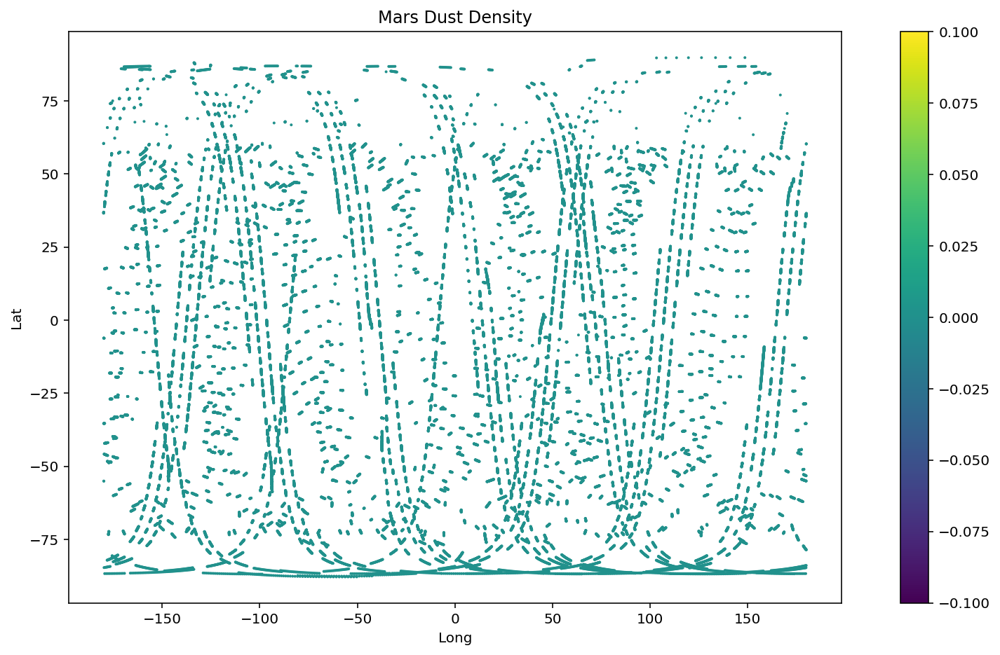

In [13]:
#date = '1-May-2015'
df_filtered = df[df.index.hour == 0]
fig, ax = plt.subplots(figsize=(15,7.5))
ax.set_aspect(1.5)
s = ax.scatter('Long','Lat', s=1, c='Hour', cmap='viridis', data=df_filtered)
ax.set_ylabel('Lat')
ax.set_xlabel('Long')
plt.title(f'Mars Dust Density')
plt.colorbar(s)
plt.show()

In [14]:
df.index.hour

Int64Index([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
            ...
            23, 23, 23, 23, 23, 23, 23, 23, 23, 23],
           dtype='int64', name='TS', length=1368817)

In [15]:
df.Dust.unique()

array([3.5271e-06, 6.5425e-07, 1.7887e-07, ..., 8.9632e-06, 8.2068e-06,
       5.8814e-06])

I used the referenced image, and tried to accurately crop it to remove the border. The coordinates range seem to match the data we have.

![](mars.jpg "Mar Surface")
![](mars_cropped.jpg "Mar Surface")

In [16]:
img = plt.imread("mars_cropped.jpg")

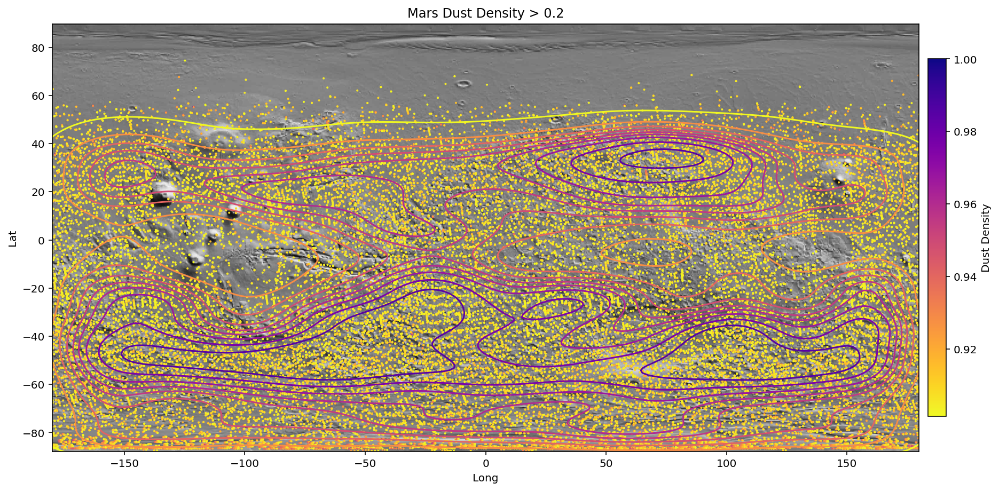

In [17]:
df_filtered = df[df.nrm_Dust > .2]
fig, ax = plt.subplots(figsize=(15,7.5))
s = ax.scatter('Long','Lat', s=1, c='nrm_log_Dust',cmap='plasma_r', data=df_filtered)
sns.kdeplot(x='Long',y='Lat',cmap='plasma_r', data=df_filtered)
ax.imshow(img, extent=[min(df.Long), max(df.Long), min(df.Lat), max(df.Lat)])
ax.set_ylabel('Lat')
ax.set_xlabel('Long')
clb = plt.colorbar(s, fraction=.02, pad=0.01, label='Dust Density')
plt.title(f'Mars Dust Density > 0.2')
plt.show()

trying out the log of the dust density

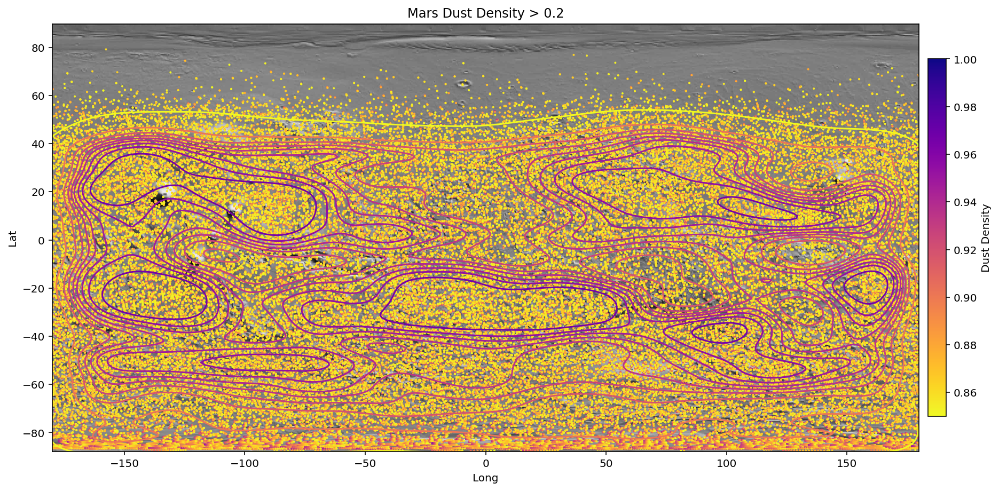

In [18]:
df_filtered = df[df.nrm_log_Dust > .85]
fig, ax = plt.subplots(figsize=(15,7.5))
s = ax.scatter('Long','Lat', s=1, c='nrm_log_Dust',cmap='plasma_r', data=df_filtered)
sns.kdeplot(x='Long',y='Lat',cmap='plasma_r', data=df_filtered)
ax.imshow(img, extent=[min(df.Long), max(df.Long), min(df.Lat), max(df.Lat)])
ax.set_ylabel('Lat')
ax.set_xlabel('Long')
clb = plt.colorbar(s, fraction=.02, pad=0.01, label='Dust Density')
plt.title(f'Mars Dust Density > 0.2')
plt.show()

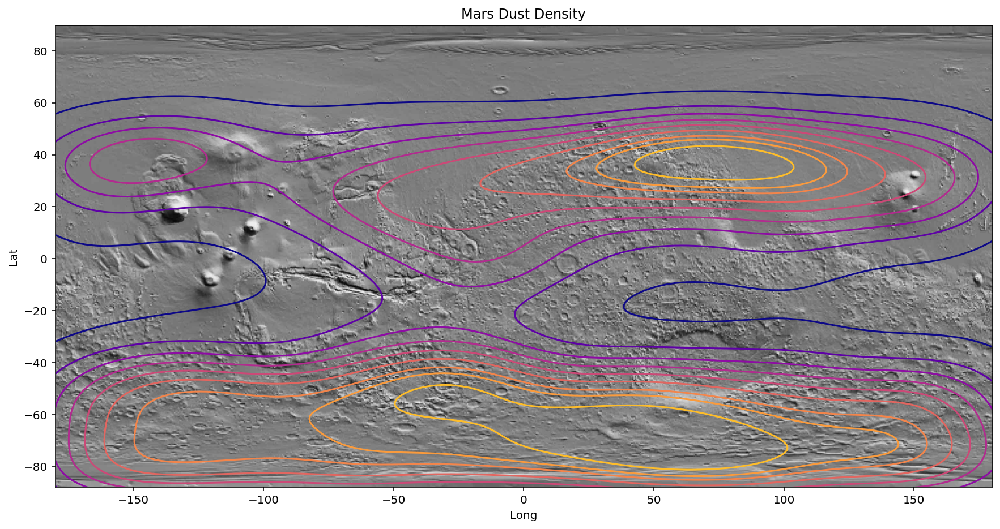

In [19]:
df_filtered = df[df.nrm_Dust > .3]
fig, ax = plt.subplots(figsize=(15,7.5))
s = sns.kdeplot(x='Long',y='Lat', cmap='plasma', data=df_filtered)
ax.imshow(img, extent=[min(df.Long), max(df.Long), min(df.Lat), max(df.Lat)])
ax.set_ylabel('Lat')
ax.set_xlabel('Long')
#clb = plt.colorbar(s, fraction=.02, pad=0.01, label='Dust Density')
plt.title(f'Mars Dust Density')
#plt.legend(s)
plt.show()

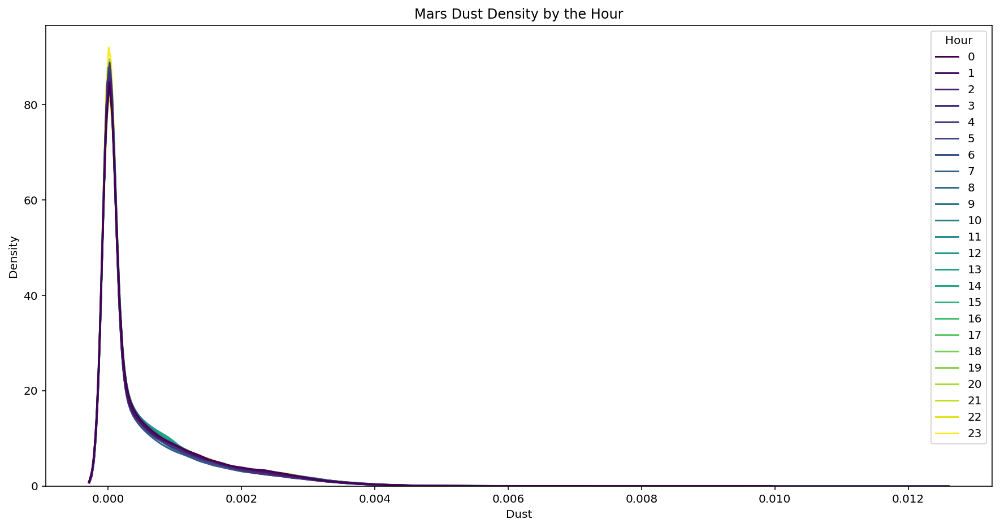

In [20]:
fig, ax = plt.subplots(figsize=(15,7.5))
sns.kdeplot(data=df, x='Dust', hue='Hour', palette='viridis', levels=5)
plt.title(f'Mars Dust Density by the Hour')
plt.show()

# Testing Time Series zhenyu's code

I had to fix the ARIMA import and the DatetimeIndex to resample the timeseries dataframe.

In [21]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot
import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA # deprecated
from statsmodels.tsa.arima.model import ARIMA

In [22]:
columns = ['Date', 'Time', 'Lat', 'Long', 'Dust', 'Dust_Err', 'H20ice', 'H20_iceErr']
df = pd.read_csv('parserData.csv', names=columns)
df['TS'] = df['Date'] + '\t' + df['Time']
df['TS'] = pd.to_datetime(df['TS'],)
df = df.set_index('TS')
df['Hour'] = df.index.hour
df

,Date,Time,Lat,Long,Dust,Dust_Err,H20ice,H20_iceErr,Hour
TS,,,,,,,,,
2015-04-01 00:00:29.190,01-Apr-2015,00:00:29.190,76.926,11.539,3.527100e-06,0.000003,0.002969,0.000473,0
2015-04-01 00:00:29.190,01-Apr-2015,00:00:29.190,76.958,11.569,6.542500e-07,0.000001,0.003295,0.000390,0
2015-04-01 00:00:29.190,01-Apr-2015,00:00:29.190,76.989,11.599,1.788700e-07,0.000001,0.003487,0.000336,0
2015-04-01 00:00:29.190,01-Apr-2015,00:00:29.190,77.021,11.629,5.223300e-08,0.000001,0.003401,0.000305,0
2015-04-01 00:00:29.190,01-Apr-2015,00:00:29.190,77.052,11.659,1.393500e-08,0.000001,0.002850,0.000280,0
...,...,...,...,...,...,...,...,...,...
2015-04-30 23:59:07.023,30-Apr-2015,23:59:07.023,60.112,51.726,5.881400e-06,0.000004,0.000010,0.000009,23
2015-04-30 23:59:07.023,30-Apr-2015,23:59:07.023,60.153,51.785,3.499000e-06,0.000003,0.000019,0.000010,23
2015-04-30 23:59:07.023,30-Apr-2015,23:59:07.023,60.196,51.846,2.090600e-06,0.000002,0.000027,0.000009,23


In [23]:
df_t = df.resample('d').mean()
df_t

,Lat,Long,Dust,Dust_Err,H20ice,H20_iceErr,Hour
TS,,,,,,,
2015-04-01,-7.592819,4.423410,0.000632,0.000025,-110.080762,-110.081054,9.872705
2015-04-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-04-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-04-04,-2.012969,-23.095245,0.000633,0.000020,-107.270416,-107.270640,20.813361
2015-04-05,-6.172454,-3.607375,0.000600,0.000019,-98.272179,-98.272408,11.479787
2015-04-06,-6.777954,-3.083760,0.000592,0.000018,-111.176038,-111.176257,11.756509
2015-04-07,-6.882860,-0.078658,0.000598,0.000018,-96.597833,-96.598063,11.686553
2015-04-08,-5.265684,0.807761,0.000603,0.000019,-100.730246,-100.730486,11.219540
2015-04-09,-5.236264,3.822600,0.000594,0.000018,-109.046929,-109.047173,11.346801


In [24]:
#df_t = df_t[df_t.index > '2015-04-04'] # To skip missing days with NaNs
df_t.interpolate(method='time', inplace=True) # interpolate missing values
df_t

,Lat,Long,Dust,Dust_Err,H20ice,H20_iceErr,Hour
TS,,,,,,,
2015-04-01,-7.592819,4.423410,0.000632,0.000025,-110.080762,-110.081054,9.872705
2015-04-02,-5.732869,-4.749475,0.000632,0.000024,-109.143980,-109.144249,13.519590
2015-04-03,-3.872919,-13.922360,0.000632,0.000022,-108.207198,-108.207444,17.166475
2015-04-04,-2.012969,-23.095245,0.000633,0.000020,-107.270416,-107.270640,20.813361
2015-04-05,-6.172454,-3.607375,0.000600,0.000019,-98.272179,-98.272408,11.479787
2015-04-06,-6.777954,-3.083760,0.000592,0.000018,-111.176038,-111.176257,11.756509
2015-04-07,-6.882860,-0.078658,0.000598,0.000018,-96.597833,-96.598063,11.686553
2015-04-08,-5.265684,0.807761,0.000603,0.000019,-100.730246,-100.730486,11.219540
2015-04-09,-5.236264,3.822600,0.000594,0.000018,-109.046929,-109.047173,11.346801


In [25]:
df_t.index

DatetimeIndex(['2015-04-01', '2015-04-02', '2015-04-03', '2015-04-04',
               '2015-04-05', '2015-04-06', '2015-04-07', '2015-04-08',
               '2015-04-09', '2015-04-10', '2015-04-11', '2015-04-12',
               '2015-04-13', '2015-04-14', '2015-04-15', '2015-04-16',
               '2015-04-17', '2015-04-18', '2015-04-19', '2015-04-20',
               '2015-04-21', '2015-04-22', '2015-04-23', '2015-04-24',
               '2015-04-25', '2015-04-26', '2015-04-27', '2015-04-28',
               '2015-04-29', '2015-04-30'],
              dtype='datetime64[ns]', name='TS', freq='D')

In [26]:
model=ARIMA(df_t['Dust'],order=(1,0,2))
model_fit=model.fit()

/usr/local/Caskroom/miniconda/base/envs/depaul/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [27]:
df_t_min = df.resample('1min').mean()
df_t_min['Dust'].interpolate(method='time', inplace=True)
df_t_min

,Lat,Long,Dust,Dust_Err,H20ice,H20_iceErr,Hour
TS,,,,,,,
2015-04-01 00:00:00,76.617909,15.234455,4.031861e-07,0.000001,0.001941,0.000230,0.0
2015-04-01 00:01:00,73.533400,8.280200,9.547337e-07,0.000002,0.002655,0.000267,0.0
2015-04-01 00:02:00,70.421538,6.164615,2.263008e-09,0.000001,0.001743,0.000135,0.0
2015-04-01 00:03:00,67.243556,11.621667,1.000000e-09,0.000001,0.002532,0.000162,0.0
2015-04-01 00:04:00,NaN,NaN,1.000000e-09,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2015-04-30 23:55:00,NaN,NaN,8.699489e-07,NaN,NaN,NaN,NaN
2015-04-30 23:56:00,71.702923,61.529115,9.224086e-07,0.000001,0.000842,0.000072,23.0
2015-04-30 23:57:00,78.820214,60.368357,7.562364e-08,0.000001,0.001736,0.000228,23.0


In [28]:
model=ARIMA(df_t_min['Dust'],order=(1,0,2))
model_fit=model.fit()

/usr/local/Caskroom/miniconda/base/envs/depaul/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
